<a href="https://colab.research.google.com/github/codefinite-vri/Underwater-Acoustic-Image-Processing-Codes/blob/main/Classical_Methods.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import numpy as np
import pandas as pd
import cv2 as cv 
from google.colab.patches import cv2_imshow # for image display
from skimage import io
from PIL import Image 
import matplotlib.pylab as plt

import glob
from tqdm import tqdm
import warnings;
warnings.filterwarnings('ignore')

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
images = glob.glob('/content/drive/My Drive/Marine_Debris_Detection_Dataset_Main/fls-images/*.png')

In [ ]:
from keras.preprocessing import image

In [ ]:
import PIL

In [ ]:
all_images = []

for i in tqdm(images):
  img = image.load_img(i, target_size=(120,120,3))
  img = image.img_to_array(img)
  img = img/255.
  all_images.append(img)

  0%|          | 0/1868 [00:00<?, ?it/s]


AttributeError: ignored

In [ ]:
for i in range(0, 90, 9):
  fig, axes = plt.subplots(1, 9)
  fig.set_size_inches(30,25)
  axes[0].imshow(all_images[i], cmap='gray')
  axes[1].imshow(all_images[i+1], cmap='gray')
  axes[2].imshow(all_images[i+2], cmap='gray')
  axes[3].imshow(all_images[i+3], cmap='gray')
  axes[4].imshow(all_images[i+4], cmap='gray')
  axes[5].imshow(all_images[i+5], cmap='gray')
  axes[6].imshow(all_images[i+6], cmap='gray')
  axes[7].imshow(all_images[i+7], cmap='gray')
  axes[8].imshow(all_images[i+8], cmap='gray')
  plt.show()

IndexError: ignored

Error in callback <function flush_figures at 0x7f7193a4c2f0> (for post_execute):


KeyboardInterrupt: ignored

In [ ]:
img = io.imread('/content/drive/My Drive/Marine_Debris_Detection_Dataset_Main/fls-images/marine-debris-aris3k-30.png')

In [ ]:
gray_image = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
cv2_imshow(gray_image)

error: ignored

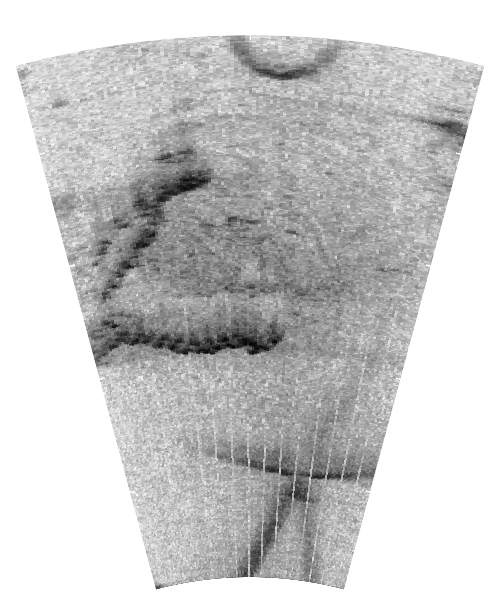

In [ ]:
im2 = 255 - gray_image
cv2_imshow(im2)

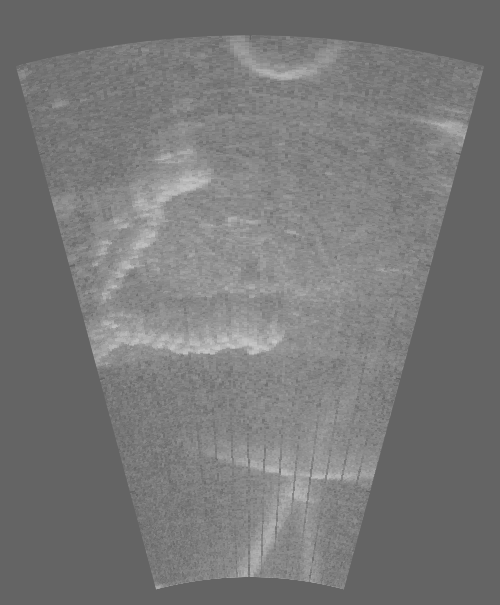

In [ ]:
im3 = (100.0/255)*gray_image + 100
cv2_imshow(im3)

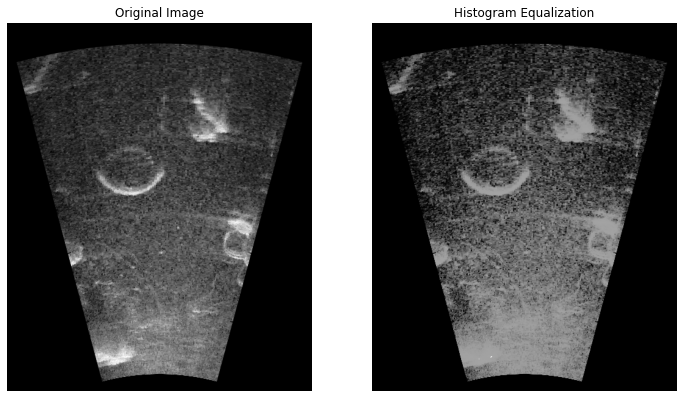

In [ ]:
def histeq(im, nbr_bins = 256):
  """ Histogram equalization of a grayscale image.  """
  # get the image histogram
  imhist, bins = np.histogram(im.flatten(), nbr_bins, [0, 256])
  cdf = imhist.cumsum() # cumulative distribution function
  cdf = imhist.max()*cdf/cdf.max()  #normalize
  cdf_mask = np.ma.masked_equal(cdf, 0)
  cdf_mask = (cdf_mask - cdf_mask.min())*255/(cdf_mask.max()-cdf_mask.min())
  cdf = np.ma.filled(cdf_mask,0).astype('uint8')
  return cdf[im.astype('uint8')]
im5 = histeq(img)

# apply the function on your dark image to increase the contrast
# we could observe that the contrast of the black background has increased
fig, axes = plt.subplots(1, 2)
fig.set_size_inches(12, 8)
axes[0].imshow(img); 
axes[0].axis('off')
axes[0].set_title('Original Image')
axes[1].imshow(im5, cmap='gray'); 
axes[1].axis('off')
axes[1].set_title('Histogram Equalization')
plt.show()


Text(0.5, 1.0, 'Histeq')

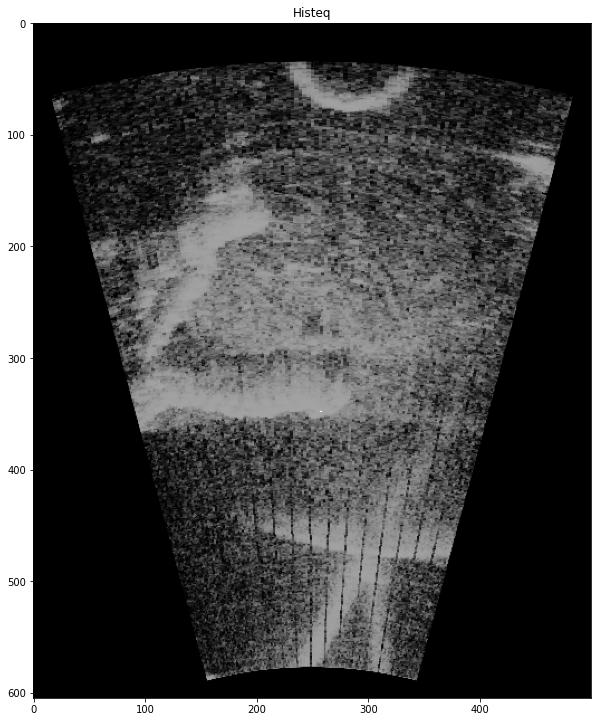

In [ ]:
def histeq(im, nbr_bins = 256):
  """ Histogram equalization of a grayscale image.  """
  # get the image histogram
  imhist, bins = np.histogram(im.flatten(), nbr_bins, [0, 256])
  cdf = imhist.cumsum() # cumulative distribution function
  cdf = imhist.max()*cdf/cdf.max()  #normalize
  cdf_mask = np.ma.masked_equal(cdf, 0)
  cdf_mask = (cdf_mask - cdf_mask.min())*255/(cdf_mask.max()-cdf_mask.min())
  cdf = np.ma.filled(cdf_mask,0).astype('uint8')
  return cdf[im.astype('uint8')]
im5 = histeq(img)
plt.figure(figsize=(10, 15)); plt.imshow(im5, cmap='gray'); plt.title('Histeq')

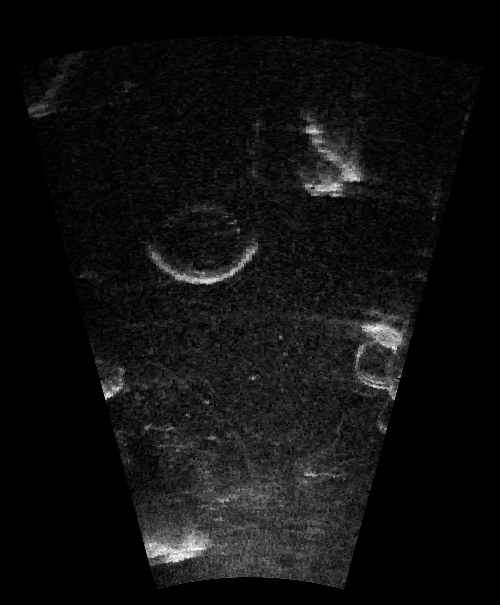

In [ ]:
im4 = 255.0*(gray_image/255.0)**2
cv2_imshow(im4)

In [ ]:
pip install findpeaks

  Created wheel for wget: filename=wget-3.2-cp36-none-any.whl size=9682 sha256=13517b0c96b0e898fb2fb50d6543b7cc3efc03b192c3c3e6f11d858934882a9b
  Stored in directory: /root/.cache/pip/wheels/40/15/30/7d8f7cea2902b4db79e3fea550d7d7b85ecb27ef992b618f3f
Successfully built wget


In [ ]:
import findpeaks
import matplotlib.pyplot as plt

In [ ]:
import numpy as np
import pandas as pd
import cv2 as cv 
from google.colab.patches import cv2_imshow # for image display
from skimage import io
from PIL import Image 
import matplotlib.pylab as plt

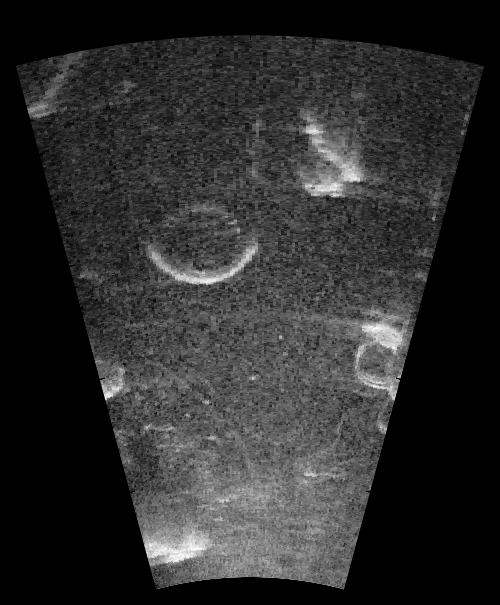

In [ ]:
image = io.imread('/content/drive/My Drive/Marine_Debris_Detection_Dataset_Main/fls-images/marine-debris-aris3k-30.png') 
image_2 = cv.cvtColor(image, cv.COLOR_BGR2GRAY)
cv2_imshow(image_2)
print('\n')

[findpeaks] >Resizing image to (500, 700).
[findpeaks] >Conversion to gray image.
[findpeaks] >Scaling image between [0-255] and to uint8
[findpeaks] >Denoising with [fastnl], window: [85].
[findpeaks] >Denoising with [bilateral], window: [85].


Text(0.5, 1.0, 'Median')

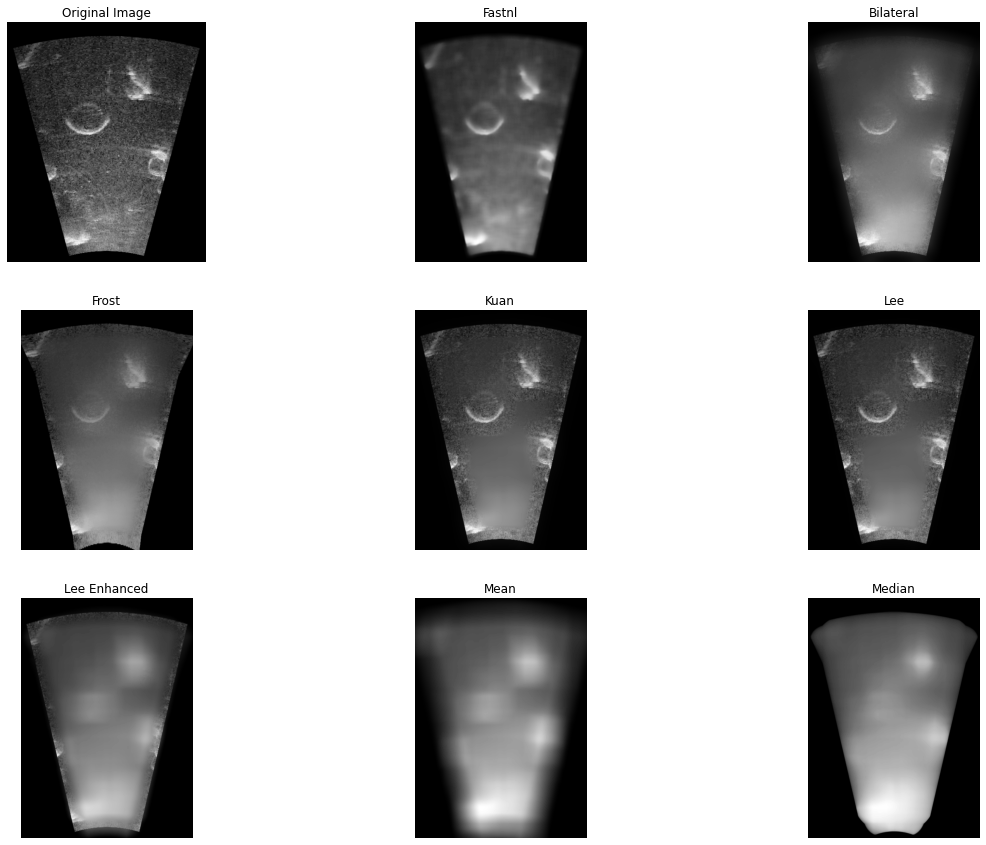

In [ ]:
# filters parameters
# window size
winsize = 85
# damping factor for frost
k_value1 = 2.0
# damping factor for lee enhanced
k_value2 = 1.0
# coefficient of variation of noise
cu_value = 0.25
# coefficient of variation for lee enhanced of noise
cu_lee_enhanced = 0.523
# max coefficient of variation for lee enhanced
cmax_value = 1.73

# Some pre-processing
# Resize
img = findpeaks.stats.resize(image, size=(500,700))
# Make grey image
img = findpeaks.stats.togray(img)
# Scale between [0-255]
img = findpeaks.stats.scale(img)

# Denoising
# fastnl
img_fastnl = findpeaks.stats.denoise(img, method='fastnl', window=winsize)
# bilateral
img_bilateral = findpeaks.stats.denoise(img, method='bilateral', window=winsize)
# frost filter
img_frost = findpeaks.frost_filter(img, damping_factor=k_value1, win_size=winsize)
# kuan filter
img_kuan = findpeaks.kuan_filter(img, win_size=winsize, cu=cu_value)
# lee filter
img_lee = findpeaks.lee_filter(img, win_size=winsize, cu=cu_value)
# lee enhanced filter
img_lee_enhanced = findpeaks.lee_enhanced_filter(img, win_size=winsize, k=k_value2, cu=cu_lee_enhanced, cmax=cmax_value)
# mean filter
img_mean = findpeaks.mean_filter(img, win_size=winsize)
# median filter
img_median = findpeaks.median_filter(img, win_size=winsize)


fig, axes = plt.subplots(3, 3 )
fig.set_size_inches(20, 15)
axes[0, 0].imshow(image, cmap='gray'); 
axes[0, 0].axis('off')
axes[0, 0].set_title('Original Image')
axes[0, 1].imshow(img_fastnl, cmap='gray'); 
axes[0, 1].axis('off')
axes[0, 1].set_title('Fastnl')
axes[0, 2].imshow(img_bilateral, cmap='gray'); 
axes[0, 2].axis('off')
axes[0, 2].set_title('Bilateral')
axes[1, 0].imshow(img_frost, cmap='gray'); 
axes[1, 0].axis('off')
axes[1, 0].set_title('Frost')
axes[1, 1].imshow(img_kuan, cmap='gray'); 
axes[1, 1].axis('off')
axes[1, 1].set_title('Kuan')
axes[1, 2].imshow(img_lee, cmap='gray'); 
axes[1, 2].axis('off')
axes[1, 2].set_title('Lee')
axes[2, 0].imshow(img_lee_enhanced, cmap='gray'); 
axes[2, 0].axis('off')
axes[2, 0].set_title('Lee Enhanced')
axes[2, 1].imshow(img_mean, cmap='gray'); 
axes[2, 1].axis('off')
axes[2, 1].set_title('Mean')
axes[2, 2].imshow(img_median, cmap='gray'); 
axes[2, 2].axis('off')
axes[2, 2].set_title('Median')

In [ ]:
psnr_median = peak_signal_noise_ratio(image, img_median)

ValueError: ignored

In [ ]:
from tensorflow.processing.image import shape

ModuleNotFoundError: ignored

In [ ]:
alpha = 1 # Contrast control (1.0-3.0)
beta = 0 # Brightness control (0-100)
for y in range(image.shape[0]):
    for x in range(image.shape[1]):
        for c in range(image.shape[2]):
            new_image[y,x,c] = np.clip(alpha*image[y,x,c] + beta, 0, 255)


adjusted = cv.convertScaleAbs(img_bilateral, alpha=alpha, beta=beta)

plt.figure(figsize=(4, 6)); plt.imshow(img_bilateral, cmap='gray'); plt.title('input')
plt.figure(figsize=(4, 6)); plt.imshow(adjusted, cmap='gray'); plt.title('output')

NameError: ignored

Text(0.5, 1.0, 'CLAHE')

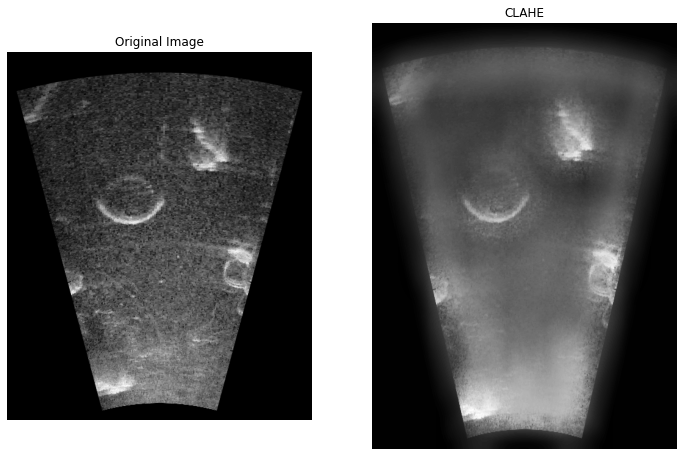

In [ ]:
clahe = cv.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
cl1 = clahe.apply(img_bilateral)

fig, axes = plt.subplots(1,2 )
fig.set_size_inches(12, 8)
axes[0].imshow(image); 
axes[0].axis('off')
axes[0].set_title('Original Image')
axes[1].imshow(cl1, cmap='gray'); 
axes[1].axis('off')
axes[1].set_title('CLAHE')

Estimated Gaussian noise standard deviation = {sigma_est}


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


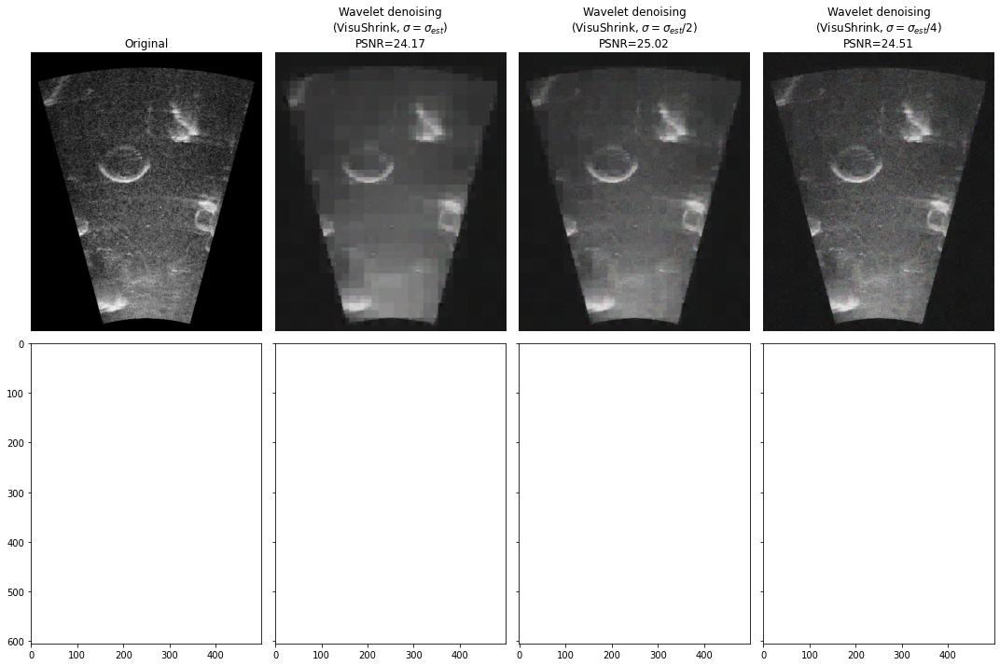

In [ ]:
import matplotlib.pyplot as plt

from skimage.restoration import (denoise_wavelet, estimate_sigma)
from skimage import data, img_as_float
from skimage.util import random_noise
from skimage.metrics import peak_signal_noise_ratio


original = img_as_float(image)

sigma = 0.12
noisy = random_noise(original, var=sigma**2)

fig, ax = plt.subplots(nrows=2, ncols=4, figsize=(8, 5),
                       sharex=True, sharey=True)

plt.gray()

# Estimate the average noise standard deviation across color channels.
sigma_est = estimate_sigma(noisy, multichannel=True, average_sigmas=True)
# Due to clipping in random_noise, the estimate will be a bit smaller than the
# specified sigma.
print("Estimated Gaussian noise standard deviation = {sigma_est}")

im_bayes = denoise_wavelet(noisy, multichannel=True, method='BayesShrink', mode='soft', rescale_sigma=True)
im_visushrink = denoise_wavelet(noisy, multichannel=True, method='VisuShrink', mode='soft', sigma=sigma_est, rescale_sigma=True)

# VisuShrink is designed to eliminate noise with high probability, but this
# results in a visually over-smooth appearance.  Repeat, specifying a reduction
# in the threshold by factors of 2 and 4.
im_visushrink2 = denoise_wavelet(noisy, multichannel=True,  method='VisuShrink', mode='soft',sigma=sigma_est/2, rescale_sigma=True)
im_visushrink4 = denoise_wavelet(noisy, multichannel=True, 
                                 method='VisuShrink', mode='soft',
                                 sigma=sigma_est/4, rescale_sigma=True)

# Compute PSNR as an indication of image quality
psnr_noisy = peak_signal_noise_ratio(original, noisy)
psnr_bayes = peak_signal_noise_ratio(original, im_bayes)
psnr_visushrink = peak_signal_noise_ratio(original, im_visushrink)
psnr_visushrink2 = peak_signal_noise_ratio(original, im_visushrink2)
psnr_visushrink4 = peak_signal_noise_ratio(original, im_visushrink4)
fig. set_size_inches(15,10)
ax[0, 0].imshow(original)
ax[0, 0].axis('off')
ax[0, 0].set_title('Original')

ax[0, 1].imshow(im_visushrink)
ax[0, 1].axis('off')
ax[0, 1].set_title(
    'Wavelet denoising\n(VisuShrink, $\\sigma=\\sigma_{est}$)\n'
     'PSNR=%0.4g' % psnr_visushrink)

ax[0, 2].imshow(im_visushrink2)
ax[0, 2].axis('off')
ax[0, 2].set_title(
    'Wavelet denoising\n(VisuShrink, $\\sigma=\\sigma_{est}/2$)\n'
     'PSNR=%0.4g' % psnr_visushrink2)
ax[0, 3].imshow(im_visushrink4)
ax[0, 3].axis('off')
ax[0, 3].set_title(
    'Wavelet denoising\n(VisuShrink, $\\sigma=\\sigma_{est}/4$)\n'
     'PSNR=%0.4g' % psnr_visushrink4)
fig.tight_layout()

plt.show()

In [ ]:
pip install bm3d

     |████████████████████████████████| 8.4MB 489kB/s 


In [ ]:
import bm3d

denoised_image = bm3d.bm3d(image, sigma_psd=250/255, stage_arg=bm3d.BM3DStages.HARD_THRESHOLDING)

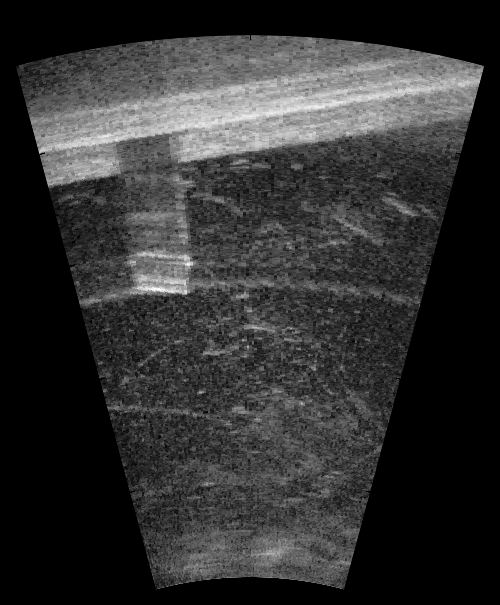

In [ ]:
cv2_imshow(denoised_image)

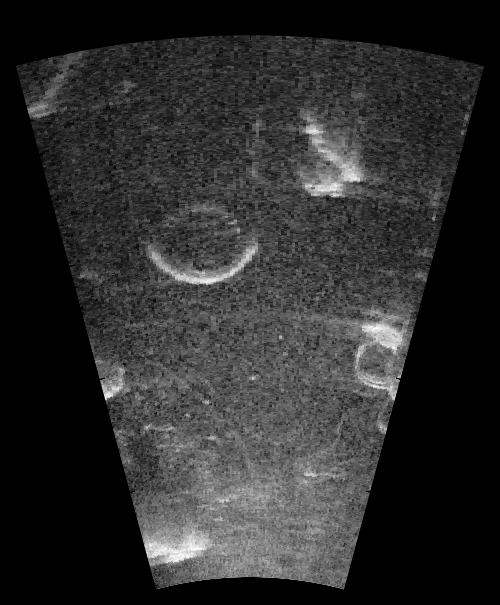

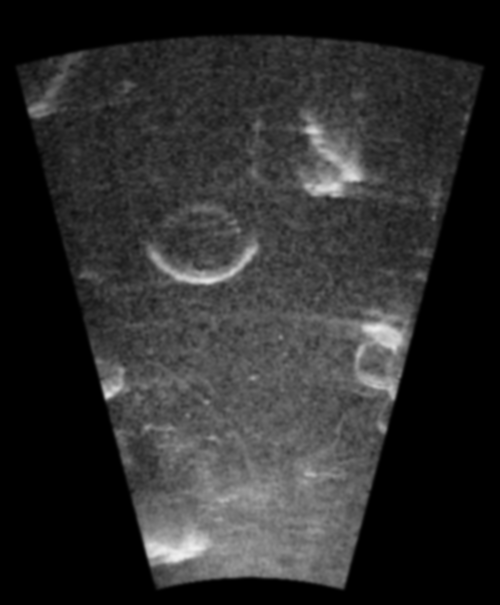

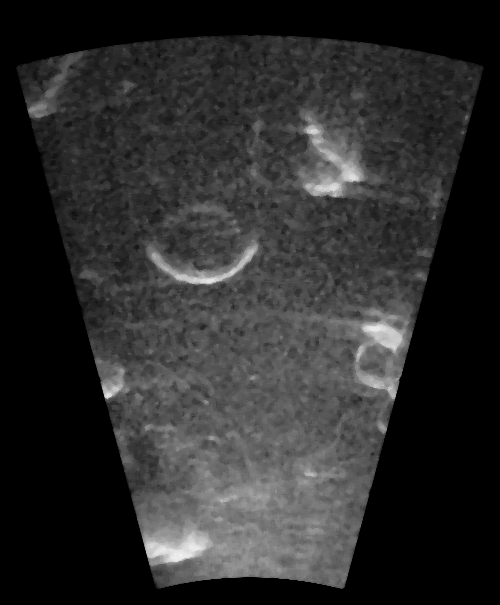

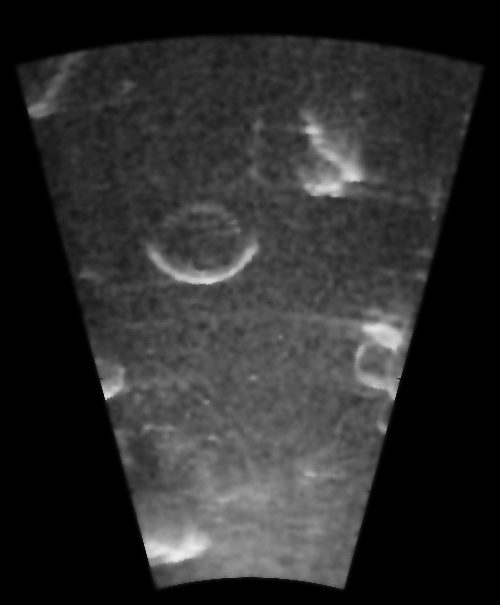

In [ ]:
import cv2
cv2_imshow(gray_image) 
# Gaussian Blur 
Gaussian = cv2.GaussianBlur(gray_image, (7, 7), 0) 
cv2_imshow( Gaussian) 
  
# Median Blur 
median = cv2.medianBlur(gray_image, 5) 
cv2_imshow( median) 

# Bilateral Blur 
bilateral = cv2.bilateralFilter(gray_image, 9, 75, 75) 
cv2_imshow( bilateral) 

In [ ]:
def wiener_filter(img, kernel, K):
  kernel /=np.sum(kernel)
  dummy=np.copy(img)
  dummy=fft2(dummy)
  kernel=fft2(kernel, s=img.shape)
  kernel=np.conj(kernel)/(np.abs(kernel)**2+K)
  dummy = dummy*kernel
  dummy = np.abs(ifft2(dummy))
  return dummy

In [ ]:
from scipy.signal import gaussian, convolve2d

In [ ]:
from numpy.fft import fft2, ifft2

Text(0.5, 1.0, 'Wiener Filter')

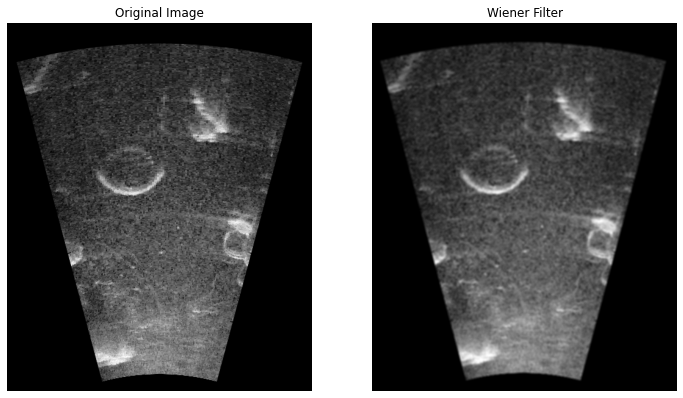

In [ ]:
def gaussian_kernel(kernel_size = 3):
	h = gaussian(kernel_size, kernel_size / 3).reshape(kernel_size, 1)
	h = np.dot(h, h.transpose())
	h /= np.sum(h)
	return h
kernel=gaussian_kernel(5)
filtered_img_1=wiener_filter(gray_image, kernel, K=10)

fig, axes = plt.subplots(1,2 )
fig.set_size_inches(12, 8)
axes[0].imshow(image); 
axes[0].axis('off')
axes[0].set_title('Original Image')
axes[1].imshow(filtered_img_1, cmap='gray'); 
axes[1].axis('off')
axes[1].set_title('Wiener Filter')


In [ ]:
import os
import numpy as np
from numpy.fft import fft2, ifft2
from scipy.signal import gaussian, convolve2d
import matplotlib.pyplot as plt

def blur(img, kernel_size = 3):
	dummy = np.copy(img)
	h = np.eye(kernel_size) / kernel_size
	dummy = convolve2d(dummy, h, mode = 'valid')
	return dummy

def add_gaussian_noise(img, sigma):
	gauss = np.random.normal(0, sigma, np.shape(img))
	noisy_img = img + gauss
	noisy_img[noisy_img < 0] = 0
	noisy_img[noisy_img > 255] = 255
	return noisy_img

def wiener_filter(img, kernel, K):
	kernel /= np.sum(kernel)
	dummy = np.copy(img)
	dummy = fft2(dummy)
	kernel = fft2(kernel, s = img.shape)
	kernel = np.conj(kernel) / (np.abs(kernel) ** 2 + K)
	dummy = dummy * kernel
	dummy = np.abs(ifft2(dummy))
	return dummy

def gaussian_kernel(kernel_size = 3):
	h = gaussian(kernel_size, kernel_size / 3).reshape(kernel_size, 1)
	h = np.dot(h, h.transpose())
	h /= np.sum(h)
	return h

In [ ]:
# Blur the image
blurred_img = blur(gray_image, kernel_size = 7)

# Add Gaussian noise
noisy_img = add_gaussian_noise(blurred_img, sigma = 20)

# Apply Wiener Filter
kernel = gaussian_kernel(5)
filtered_img = wiener_filter(noisy_img, kernel, K = 10)

# Display results
display = [gray_image, blurred_img, noisy_img, filtered_img]
label = ['Original Image', 'Motion Blurred Image', 'Motion Blurring + Gaussian Noise', 'Wiener Filter applied']



<Figure size 2160x1800 with 0 Axes>

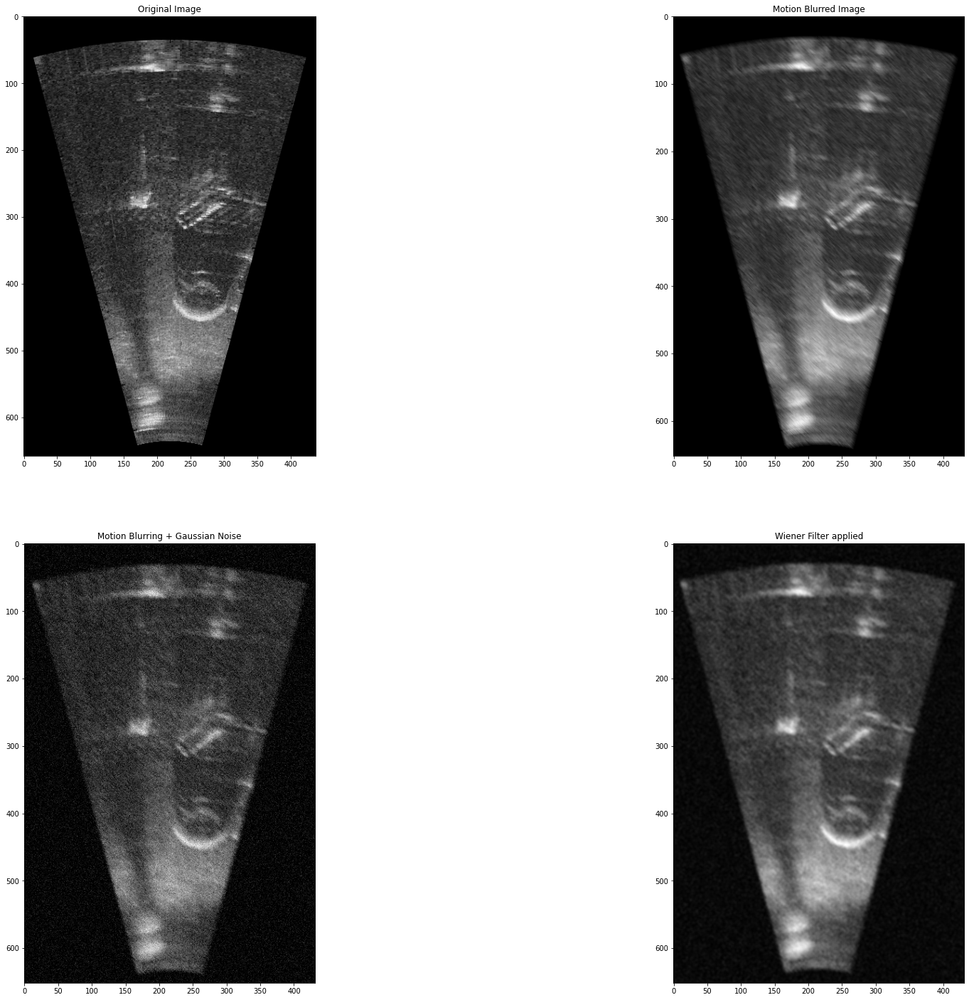

In [ ]:
fig = plt.figure(figsize=(30, 25))
for i in range(len(display)):
		fig.add_subplot(2, 2, i+1)
		plt.imshow(display[i], cmap = 'gray')
		plt.title(label[i])
plt.show()

In [ ]:
def median_filter(data, kernel_size):
    temp = []
    indexer = kernel_size // 2
    data_final = []
    data_final = np.zeros((len(data),len(data[0])))
    for i in range(len(data)):

        for j in range(len(data[0])):

            for z in range(kernel_size):
                if i + z - indexer < 0 or i + z - indexer > len(data) - 1:
                    for c in range(kernel_size):
                        temp.append(0)
                else:
                    if j + z - indexer < 0 or j + indexer > len(data[0]) - 1:
                        temp.append(0)
                    else:
                        for k in range(kernel_size):
                            temp.append(data[i + z - indexer][j + k - indexer])

            temp.sort()
            data_final[i][j] = temp[len(temp) // 2]
            temp = []
    return data_final

def add_gaussian_noise(img, sigma):
    gauss = np.random.normal(0, sigma, np.shape(img))
    noisy_img = img + gauss
    noisy_img[noisy_img < 0] = 0
    noisy_img[noisy_img > 255] = 255
    return noisy_img

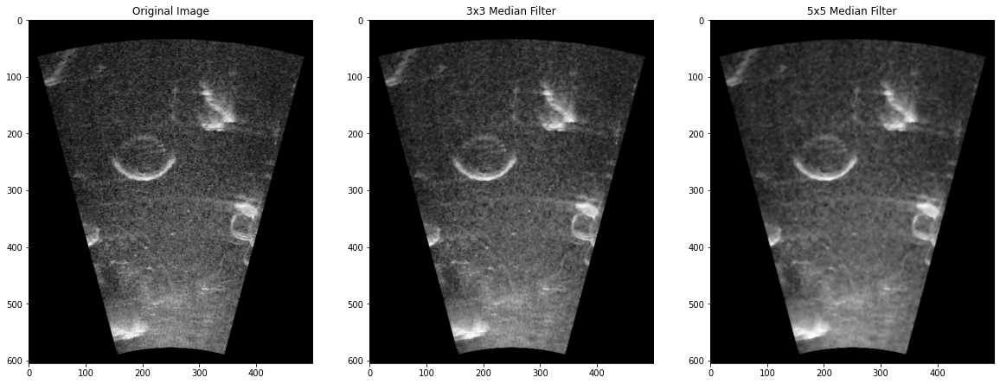

In [ ]:
removed_noise_3 = median_filter(gray_image, 3)
removed_noise_5 = median_filter(gray_image, 5)

    # Display results
fig = plt.figure(figsize = (20, 15))
display = [gray_image, removed_noise_3, removed_noise_5]
title = ['Original Image', '3x3 Median Filter', '5x5 Median Filter']

for i in range(len(display)):
  fig.add_subplot(1, 3, i+1)
  plt.imshow(display[i], cmap = 'gray')
  plt.title(title[i])
plt.show()

Text(0.5, 1.0, '3x3 Averaging Filter')

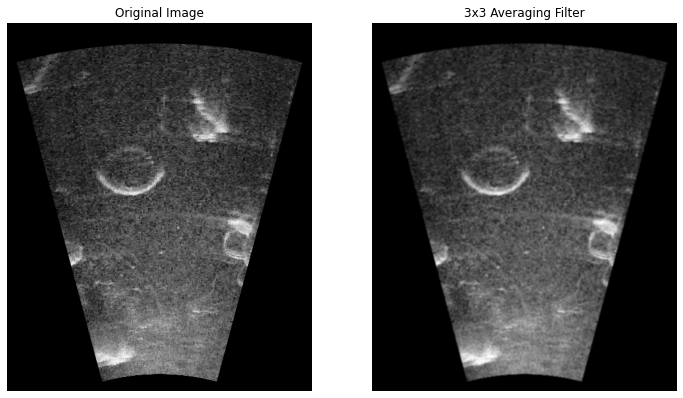

In [ ]:
m, n = gray_image.shape 
   
# Develop Averaging filter(3, 3) mask 
mask = np.ones([3, 3], dtype = int) 
mask = mask / 9
   
# Convolve the 3X3 mask over the image  
img_new = np.zeros([m, n]) 
  
for i in range(1, m-1): 
    for j in range(1, n-1): 
        temp = gray_image[i-1, j-1]*mask[0, 0]+gray_image[i-1, j]*mask[0, 1]+gray_image[i-1, j + 1]*mask[0, 2]+gray_image[i, j-1]*mask[1, 0]+ gray_image[i, j]*mask[1, 1]+gray_image[i, j + 1]*mask[1, 2]+gray_image[i + 1, j-1]*mask[2, 0]+gray_image[i + 1, j]*mask[2, 1]+gray_image[i + 1, j + 1]*mask[2, 2] 
         
        img_new[i, j]= temp 
          
img_new = img_new.astype(np.uint8) 

fig, axes = plt.subplots(1,2 )
fig.set_size_inches(12, 8)
axes[0].imshow(image); 
axes[0].axis('off')
axes[0].set_title('Original Image')
axes[1].imshow(img_new, cmap='gray'); 
axes[1].axis('off')
axes[1].set_title('3x3 Averaging Filter')

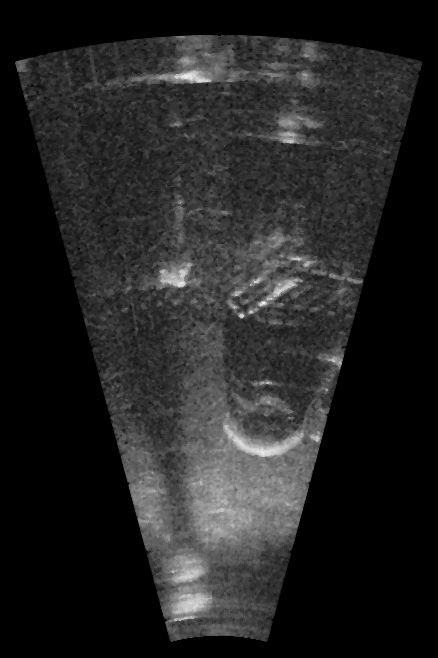

In [ ]:
m, n = gray_image.shape 

img_new1 = np.zeros([m, n]) 
  
for i in range(1, m-1): 
    for j in range(1, n-1): 
        temp = [gray_image[i-1, j-1], 
               gray_image[i-1, j], 
               gray_image[i-1, j + 1], 
               gray_image[i, j-1], 
               gray_image[i, j], 
               gray_image[i, j + 1], 
               gray_image[i + 1, j-1], 
               gray_image[i + 1, j], 
               gray_image[i + 1, j + 1]] 
          
        temp = sorted(temp) 
        img_new1[i, j]= temp[4] 
  
img_new1 = img_new1.astype(np.uint8) 
cv2_imshow(img_new1) 

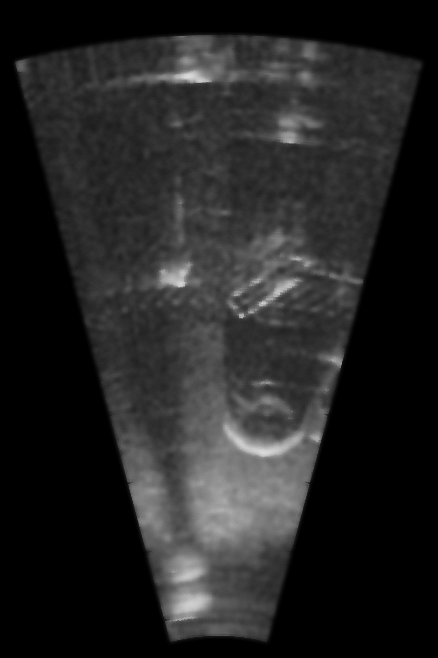

In [ ]:
blur = cv2.bilateralFilter(gray_image,9,75,75)
cv2_imshow(blur)

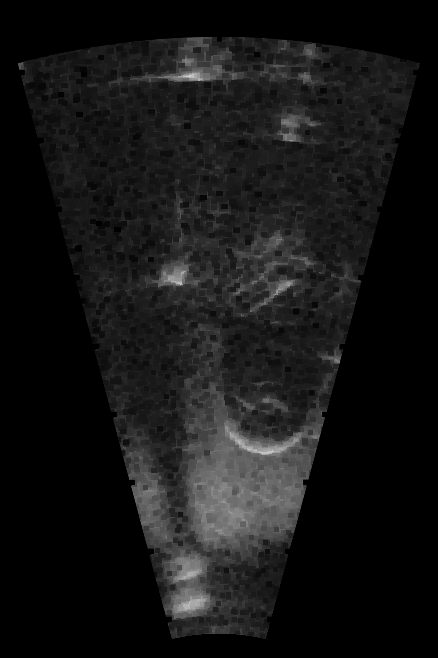

In [ ]:
kernel = np.ones((5,5),np.uint8)
erosion = cv2.erode(gray_image,kernel,iterations = 1)
cv2_imshow(erosion)

In [ ]:
import cv2

Text(0.5, 1.0, 'Gradient')

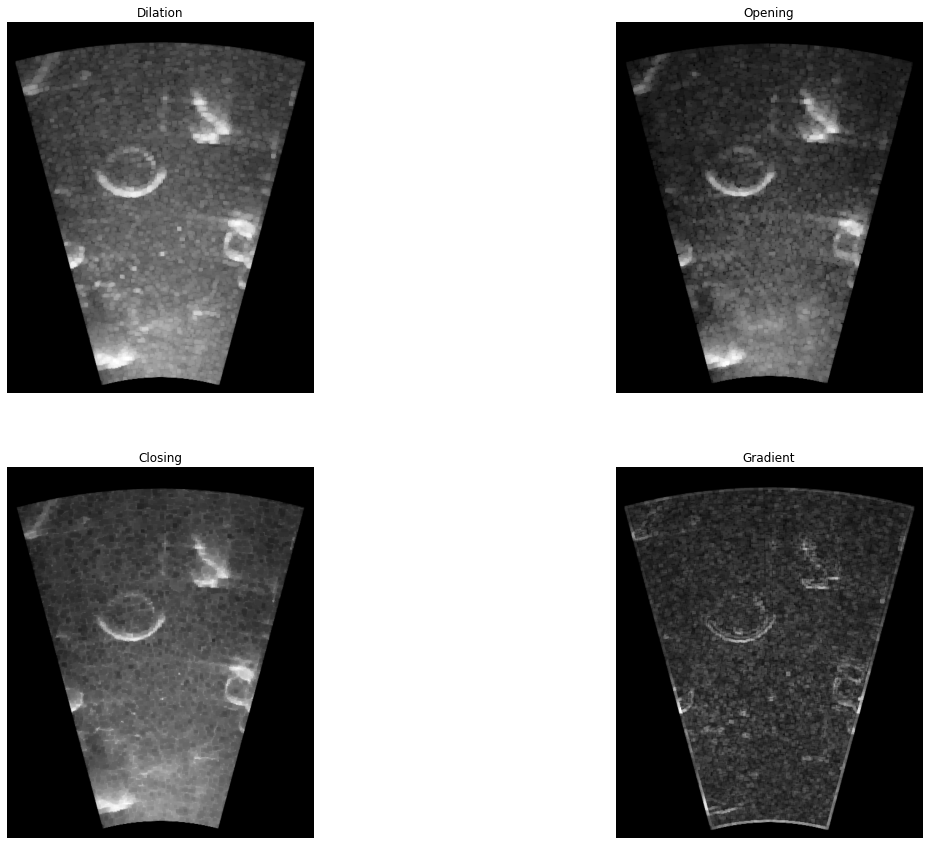

In [ ]:
dilation = cv2.dilate(gray_image,kernel,iterations = 1)
opening = cv2.morphologyEx(gray_image, cv2.MORPH_OPEN, kernel)
closing = cv2.morphologyEx(gray_image, cv2.MORPH_CLOSE, kernel)
gradient = cv2.morphologyEx(gray_image, cv2.MORPH_GRADIENT, kernel)
fig, axes = plt.subplots(2,2 )
fig.set_size_inches(20, 15)
axes[0,0].imshow(dilation); 
axes[0,0].axis('off')
axes[0,0].set_title('Dilation')
axes[0,1].imshow(opening, cmap='gray'); 
axes[0,1].axis('off')
axes[0,1].set_title('Opening')
axes[1,0].imshow(closing); 
axes[1,0].axis('off')
axes[1,0].set_title('Closing')
axes[1,1].imshow(gradient, cmap='gray'); 
axes[1,1].axis('off')
axes[1,1].set_title('Gradient')

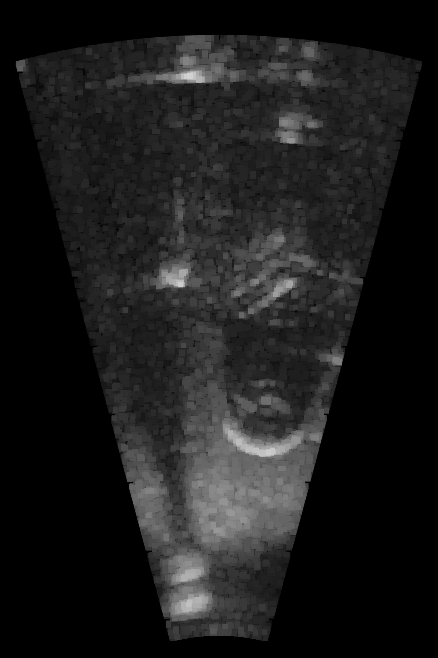

In [ ]:
opening = cv2.morphologyEx(gray_image, cv2.MORPH_OPEN, kernel)
cv2_imshow(opening)

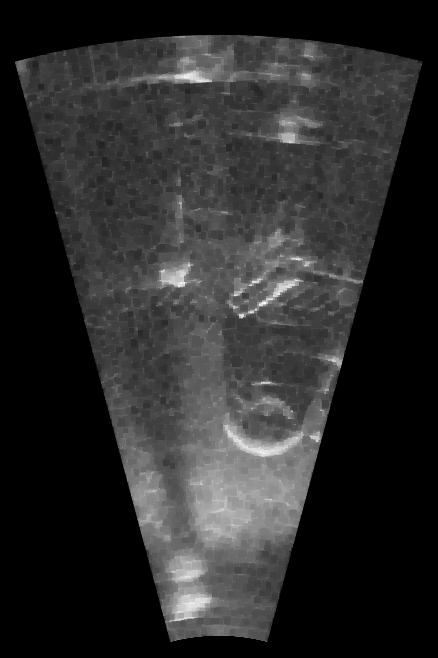

In [ ]:
closing = cv2.morphologyEx(gray_image, cv2.MORPH_CLOSE, kernel)
cv2_imshow(closing)

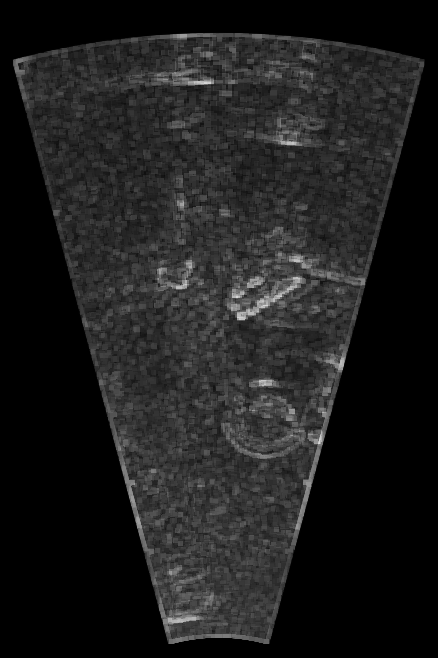

In [ ]:
gradient = cv2.morphologyEx(gray_image, cv2.MORPH_GRADIENT, kernel)cv2_imshow(gradient)

In [ ]:
mg = gray_image

Text(0.5, 1.0, 'Zero Inverse Threshold')

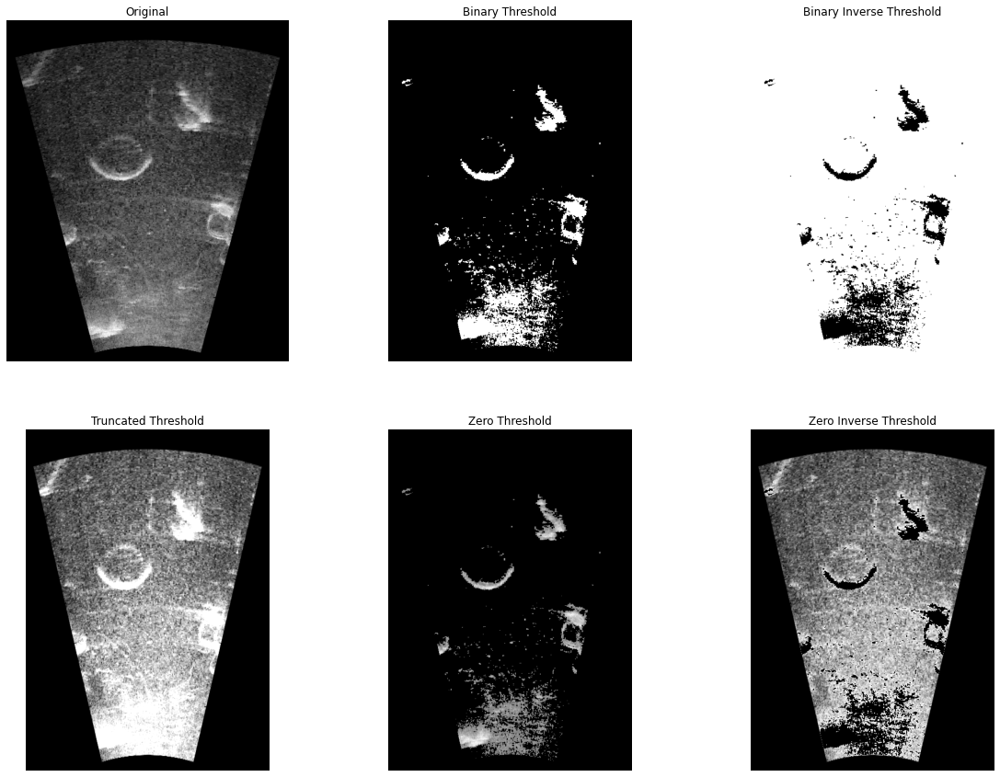

In [ ]:
ret, thresh1 = cv2.threshold(img, 120, 255, cv2.THRESH_BINARY) 
ret, thresh2 = cv2.threshold(img, 120, 255, cv2.THRESH_BINARY_INV) 
ret, thresh3 = cv2.threshold(img, 120, 255, cv2.THRESH_TRUNC) 
ret, thresh4 = cv2.threshold(img, 120, 255, cv2.THRESH_TOZERO) 
ret, thresh5 = cv2.threshold(img, 120, 255, cv2.THRESH_TOZERO_INV) 
  
# the window showing output images 
# with the corresponding thresholding  
# techniques applied to the input images 
fig, axes = plt.subplots(2,3 )
fig.set_size_inches(20, 15)
axes[0,0].imshow(original); 
axes[0,0].axis('off')
axes[0,0].set_title('Original')
axes[0,1].imshow(thresh1, cmap='gray'); 
axes[0,1].axis('off')
axes[0,1].set_title('Binary Threshold')
axes[0,2].imshow(thresh2, cmap='gray'); 
axes[0,2].axis('off')
axes[0,2].set_title('Binary Inverse Threshold')
axes[1,0].imshow(thresh3, cmap='gray'); 
axes[1,0].axis('off')
axes[1,0].set_title('Truncated Threshold')
axes[1,1].imshow(thresh4, cmap='gray'); 
axes[1,1].axis('off')
axes[1,1].set_title('Zero Threshold')
axes[1,2].imshow(thresh5, cmap='gray'); 
axes[1,2].axis('off')
axes[1,2].set_title('Zero Inverse Threshold')    

In [ ]:
def conservative_smoothing_gray(data, filter_size):
    temp = []
    
    indexer = filter_size // 2
    
    new_image = data.copy()
    
    nrow, ncol = data.shape
    
    for i in range(nrow):
        
        for j in range(ncol):
            
            for k in range(i-indexer, i+indexer+1):
                
                for m in range(j-indexer, j+indexer+1):
                    
                    if (k > -1) and (k < nrow):
                        
                        if (m > -1) and (m < ncol):
                            
                            temp.append(data[k,m])
                            
            temp.remove(data[i,j])
            
            
            max_value = max(temp)
            
            min_value = min(temp)
            
            if data[i,j] > max_value:
                
                new_image[i,j] = max_value
            
            elif data[i,j] < min_value:
                
                new_image[i,j] = min_value
            
            temp =[]
    
    return new_image.copy()

Text(0.5, 1.0, 'Conservative Smoothing Filter')

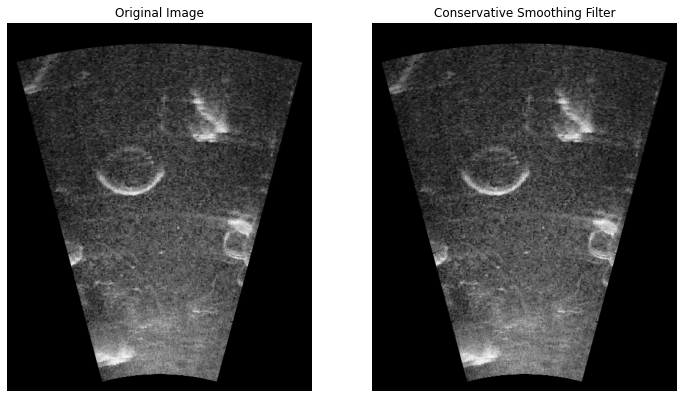

In [ ]:
new_image = conservative_smoothing_gray(gray_image,5)
fig, axes = plt.subplots(1,2 )
fig.set_size_inches(12, 8)
axes[0].imshow(image); 
axes[0].axis('off')
axes[0].set_title('Original Image')
axes[1].imshow(new_image, cmap='gray'); 
axes[1].axis('off')
axes[1].set_title('Conservative Smoothing Filter')

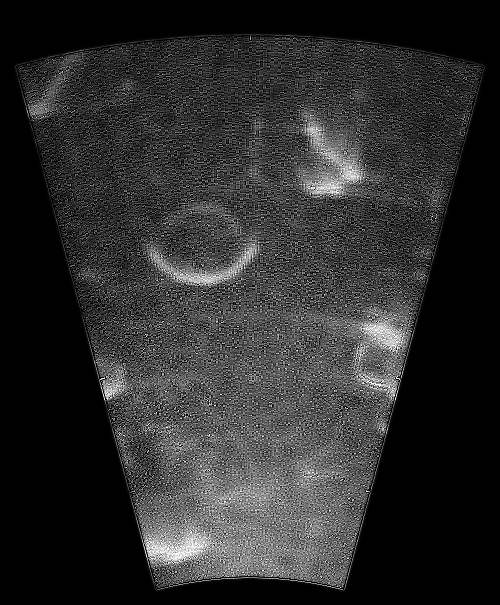

Text(0.5, 1.0, 'Laplacian Filtered Image')

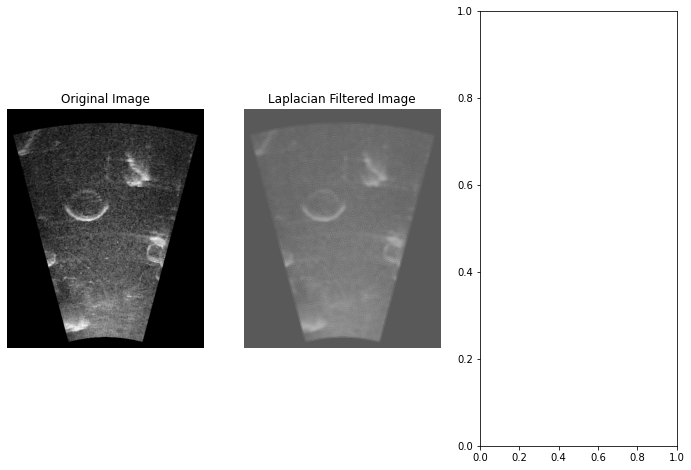

In [ ]:
new_image = cv2.Laplacian(gray_image,cv2.CV_64F)
lapf=new_image+bilateral
cv2_imshow(lapf)
fig, axes = plt.subplots(1,3 )
fig.set_size_inches(12, 8)
axes[0].imshow(original); 
axes[0].axis('off')
axes[0].set_title('Original Image')
axes[1].imshow(new_image, cmap='gray'); 
axes[1].axis('off')
axes[1].set_title('Laplacian Filter')
axes[1].imshow(lapf, cmap='gray'); 
axes[1].axis('off')
axes[1].set_title('Laplacian Filtered Image')

Text(0.5, 1.0, 'Laplacian Filtered Image')

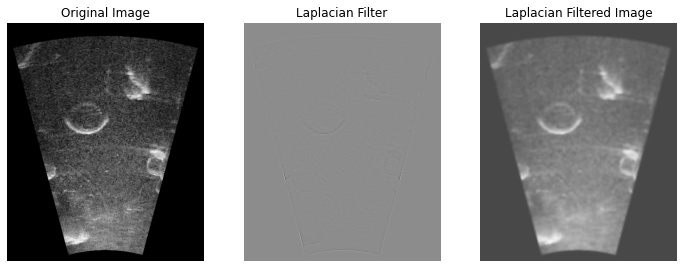

In [ ]:
new_image = cv2.Laplacian(bilateral,cv2.CV_64F)
fig, axes = plt.subplots(1,3 )
fig.set_size_inches(12, 8)
axes[0].imshow(original); 
axes[0].axis('off')
axes[0].set_title('Original Image')
axes[1].imshow(new_image); 
axes[1].axis('off')
axes[1].set_title('Laplacian Filter')
lapf=new_image+bilateral
axes[2].imshow(lapf, cmap='gray'); 
axes[2].axis('off')
axes[2].set_title('Laplacian Filtered Image')

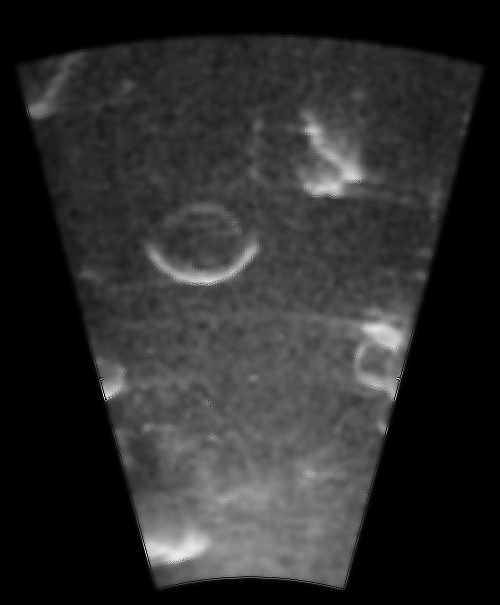

In [ ]:
lapf=new_image+bilateral
cv2_imshow(lapf)

Text(0.5, 1.0, 'Unsharp Mask')

<Figure size 2160x1800 with 0 Axes>

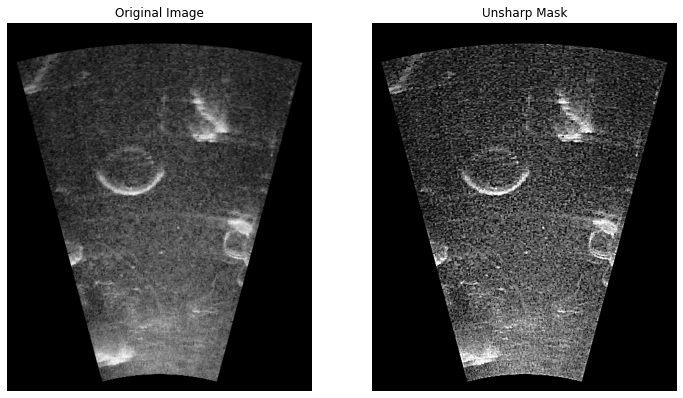

In [ ]:
from PIL import ImageFilter
fig = plt.figure(figsize=(30, 25))
image = Image.fromarray(gray_image.astype('uint8'))
new_image = image.filter(ImageFilter.UnsharpMask(radius=2, percent=150))
fig, axes = plt.subplots(1,2 )
fig.set_size_inches(12, 8)
axes[0].imshow(original); 
axes[0].axis('off')
axes[0].set_title('Original Image')
axes[1].imshow(new_image); 
axes[1].axis('off')
axes[1].set_title('Unsharp Mask')

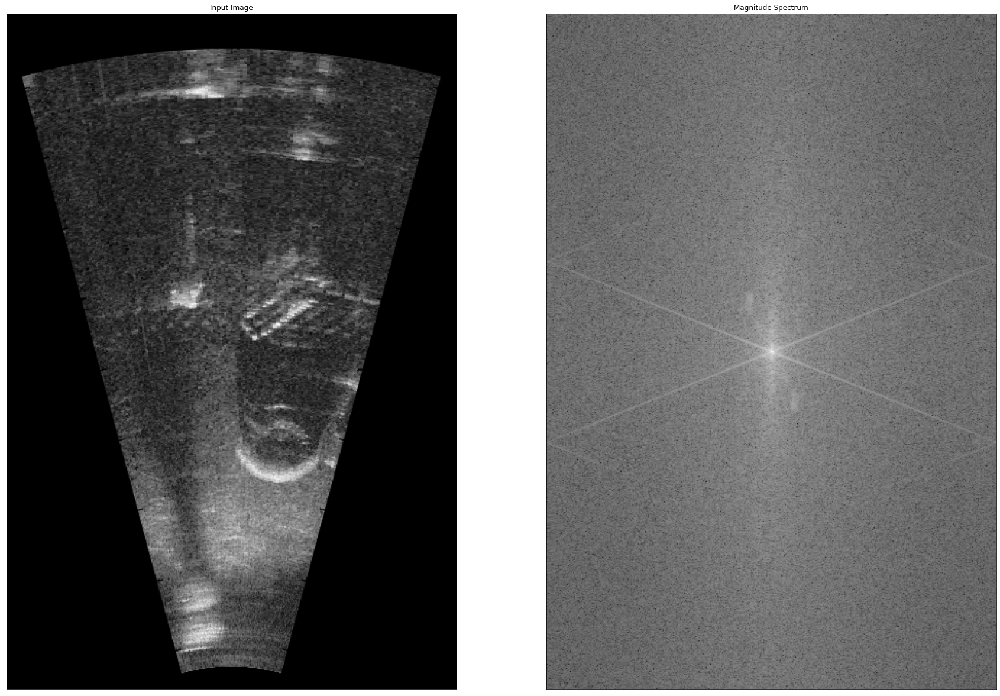

In [ ]:
dft = cv2.dft(np.float32(gray_image),flags = cv2.DFT_COMPLEX_OUTPUT)
dft_shift = np.fft.fftshift(dft)
magnitude_spectrum = 20*np.log(cv2.magnitude(dft_shift[:,:,0],dft_shift[:,:,1]))
plt.figure(figsize=(30,26))
plt.subplot(121),plt.imshow(gray_image, cmap = 'gray')
plt.title('Input Image'), plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(magnitude_spectrum, cmap = 'gray')
plt.title('Magnitude Spectrum'), plt.xticks([]), plt.yticks([])
plt.show()

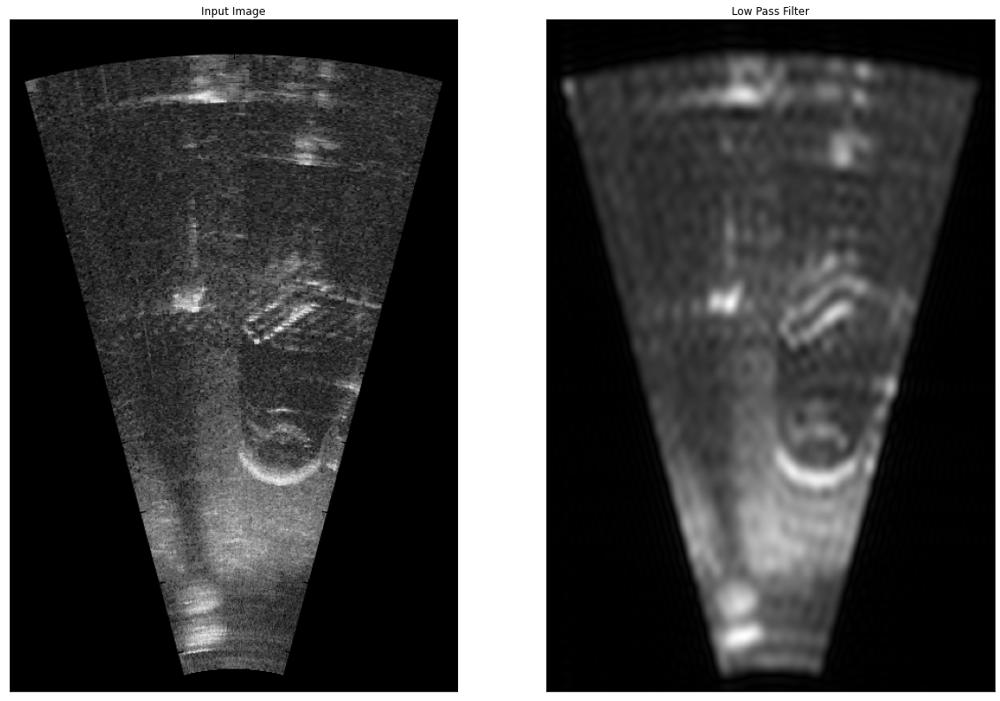

In [ ]:
rows, cols = gray_image.shape
crow,ccol = rows//2 , cols//2
mask = np.zeros((rows,cols,2),np.uint8)
mask[crow-30:crow+30, ccol-30:ccol+30] = 1
fshift = dft_shift*mask
f_ishift = np.fft.ifftshift(fshift)
img_back = cv2.idft(f_ishift)
img_back = cv2.magnitude(img_back[:,:,0],img_back[:,:,1])
plt.figure(figsize=(20,16))
plt.subplot(121),plt.imshow(gray_image, cmap = 'gray')
plt.title('Input Image'), plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(img_back, cmap = 'gray')
plt.title('Low Pass Filter'), plt.xticks([]), plt.yticks([])
plt.show()

In [ ]:
def crimmins(data):
  new_image = data.copy()
  nrow = len(data)
  ncol = len(data[0])
  for i in range(1, nrow):
    for j in range(ncol):
      if data[i-1,j] >= (data[i,j] + 2):
        new_image[i,j] += 1
        data = new_image
  for i in range(nrow):
    for j in range(ncol-1):
      if data[i,j+1] >= (data[i,j] + 2):
        new_image[i,j] += 1
        data = new_image
  for i in range(1, nrow):
    for j in range(1, ncol):
      if data[i-1,j-1] >= (data[i,j] + 2):
        new_image[i,j] += 1
        data = new_image
  for i in range(1, nrow):
    for j in range(ncol-1):
      if data[i-1,j+1] >= (data[i,j] + 2):
        new_image[i,j] += 1
        data = new_image
  for i in range(1, nrow-1):
    for j in range(ncol):
      if (data[i-1,j] > data[i,j]) and (data[i,j] <= data[i+1,j]):
        new_image[i,j] += 1
        data = new_image
  for i in range(nrow):
    for j in range(1, ncol-1):
      if (data[i,j+1] > data[i,j]) and (data[i,j] <= data[i,j-1]):
        new_image[i,j] += 1
        data = new_image
  for i in range(1, nrow-1):
    for j in range(1, ncol-1):
      if (data[i-1,j-1] > data[i,j]) and (data[i,j] <= data[i+1,j+1]):
        new_image[i,j] += 1
        data = new_image
  for i in range(1, nrow-1):
    for j in range(1, ncol-1):
      if (data[i-1,j+1] > data[i,j]) and (data[i,j] <= data[i+1,j-1]):
        new_image[i,j] += 1
        data = new_image
  for i in range(1, nrow-1):
    for j in range(ncol):
      if (data[i+1,j] > data[i,j]) and (data[i,j] <= data[i-1,j]):
        new_image[i,j] += 1
        data = new_image
  for i in range(nrow):
    for j in range(1, ncol-1):
      if (data[i,j-1] > data[i,j]) and (data[i,j] <= data[i,j+1]):
        new_image[i,j] += 1
        data = new_image
  for i in range(1, nrow-1):
    for j in range(1, ncol-1):
      if (data[i+1,j+1] > data[i,j]) and (data[i,j] <= data[i-1,j-1]):
        new_image[i,j] += 1
        data = new_image
  for i in range(1, nrow-1):
    for j in range(1, ncol-1):
      if (data[i+1,j-1] > data[i,j]) and (data[i,j] <= data[i-1,j+1]):
        new_image[i,j] += 1
        data = new_image
  for i in range(nrow-1):
    for j in range(ncol):
      if (data[i+1,j] >= (data[i,j]+2)):
        new_image[i,j] += 1
        data = new_image
  for i in range(nrow):
    for j in range(1,ncol):
      if (data[i,j-1] >= (data[i,j]+2)):
        new_image[i,j] += 1
        data = new_image
  for i in range(nrow-1):
    for j in range(ncol-1):
      if (data[i+1,j+1] >= (data[i,j]+2)):
        new_image[i,j] += 1
        data = new_image
  for i in range(nrow-1):
    for j in range(1,ncol):
      if (data[i+1,j-1] >= (data[i,j]+2)):
        new_image[i,j] += 1
        data = new_image
  for i in range(1,nrow):
    for j in range(ncol):
      if (data[i-1,j] <= (data[i,j]-2)):
        new_image[i,j] -= 1
        data = new_image
  for i in range(nrow):
    for j in range(ncol-1):
      if (data[i,j+1] <= (data[i,j]-2)):
        new_image[i,j] -= 1
        data = new_image
  for i in range(1,nrow):
    for j in range(1,ncol):
      if (data[i-1,j-1] <= (data[i,j]-2)):
        new_image[i,j] -= 1
        data = new_image
  for i in range(1,nrow):
    for j in range(ncol-1):
      if (data[i-1,j+1] <= (data[i,j]-2)):
        new_image[i,j] -= 1
        data = new_image
  for i in range(1,nrow-1):
    for j in range(ncol):
      if (data[i-1,j] < data[i,j]) and (data[i,j] >= data[i+1,j]):
        new_image[i,j] -= 1
        data = new_image
  for i in range(nrow):
    for j in range(1, ncol-1):
      if (data[i,j+1] < data[i,j]) and (data[i,j] >= data[i,j-1]):
        new_image[i,j] -= 1
        data = new_image
  for i in range(1,nrow-1):
    for j in range(1,ncol-1):
      if (data[i-1,j-1] < data[i,j]) and (data[i,j] >= data[i+1,j+1]):
        new_image[i,j] -= 1
        data = new_image
  for i in range(1,nrow-1):
    for j in range(1,ncol-1):
      if (data[i-1,j+1] < data[i,j]) and (data[i,j] >= data[i+1,j-1]):
        new_image[i,j] -= 1
        data = new_image
  for i in range(1,nrow-1):
    for j in range(ncol):
      if (data[i+1,j] < data[i,j]) and (data[i,j] >= data[i-1,j]):
        new_image[i,j] -= 1
        data = new_image
  for i in range(nrow):
    for j in range(1,ncol-1):
      if (data[i,j-1] < data[i,j]) and (data[i,j] >= data[i,j+1]):
        new_image[i,j] -= 1
        data = new_image
  for i in range(1,nrow-1):
    for j in range(1,ncol-1):
      if (data[i+1,j+1] < data[i,j]) and (data[i,j] >= data[i-1,j-1]):
        new_image[i,j] -= 1
        data = new_image
  for i in range(1,nrow-1):
    for j in range(1,ncol-1):
      if (data[i+1,j-1] < data[i,j]) and (data[i,j] >= data[i-1,j+1]):
        new_image[i,j] -= 1
        data = new_image
  for i in range(nrow-1):
    for j in range(ncol):
      if (data[i+1,j] <= (data[i,j]-2)):
        new_image[i,j] -= 1
        data = new_image
  for i in range(nrow):
    for j in range(1,ncol):
      if (data[i,j-1] <= (data[i,j]-2)):
        new_image[i,j] -= 1
        data = new_image
  for i in range(nrow-1):
    for j in range(ncol-1):
      if (data[i+1,j+1] <= (data[i,j]-2)):
        new_image[i,j] -= 1
        data = new_image
  for i in range(nrow-1):
    for j in range(1,ncol):
      if (data[i+1,j-1] <= (data[i,j]-2)):
        new_image[i,j] -= 1
        data = new_image
  return new_image.copy()

Text(0.5, 1.0, 'Crimmins Smoothing')

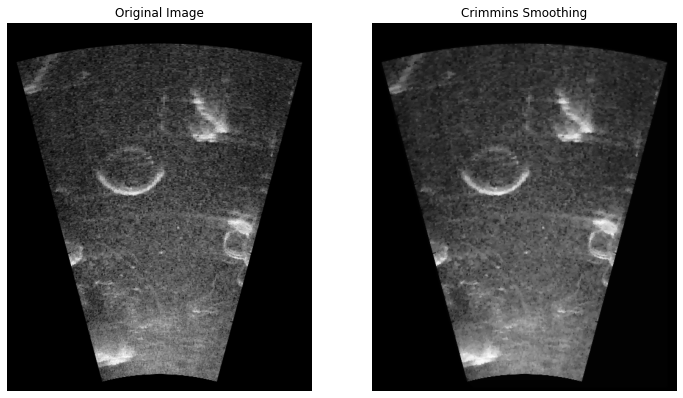

In [ ]:
new_image = crimmins(gray_image)
fig, axes = plt.subplots(1,2 )
fig.set_size_inches(12, 8)
axes[0].imshow(original); 
axes[0].axis('off')
axes[0].set_title('Original Image')
axes[1].imshow(new_image); 
axes[1].axis('off')
axes[1].set_title('Crimmins Smoothing')